In [1]:
import pandas as pd
import re
from textblob import TextBlob, Word
import random
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory
import nltk
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
import string
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn import svm, datasets, naive_bayes
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
# nltk.download('wordnet')   # for Lemmatization

%matplotlib inline

In [2]:
data = pd.read_csv(".\Data tweet classified new.csv", index_col=None)

In [3]:
data.head()

,no,date_post,username,tweet,klasifikasi
0,1.0,2023-03-21 09:46:58 SE Asia Standard Time,asuransiku_id,@codingfess Mengikuti perkembangan dan memanfa...,Positif
1,2.0,2023-03-20 21:30:21 SE Asia Standard Time,elimgo,Aku sih seneng dengan perkembangan AI ini. Mar...,Negatif
2,3.0,2023-03-20 16:56:12 SE Asia Standard Time,radzaq,Senjakala HR (?) Dunia saat ini semakin dihad...,Negatif
3,4.0,2023-03-20 16:48:09 SE Asia Standard Time,bisniscom,CEO OpenAI Sam Altman menyampaikan kekhawatira...,Negatif
4,5.0,2023-03-20 12:25:31 SE Asia Standard Time,usu_fess,usu! Belakangan perkembangan Chatbot AI udh ma...,Positif


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2579 entries, 0 to 2578
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   no           2559 non-null   float64
 1   date_post    2579 non-null   object 
 2   username     2551 non-null   object 
 3   tweet        2579 non-null   object 
 4   klasifikasi  2578 non-null   object 
dtypes: float64(1), object(4)
memory usage: 100.9+ KB


# Preprocessing

In [5]:
tweet = 'tweet'
classfier = 'klasifikasi'

In [6]:
def UnicodeFilter(input:str):
    input = re.sub("&\w+;|([^0-9A-Za-z])", ' ', input)
    deemoji_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags = re.UNICODE)
    input = deemoji_pattern.sub(r'',input)
    return input.strip()

In [7]:
txtcorrect = open('wordcorrection.txt','r').read()
WORDS = dict(x.split('=') for x in txtcorrect.splitlines())

def WordsFix(input:str):
    output = []
    for word in input.lower().split():
        collected_word = re.findall(r'\w+', word)
        for word2 in collected_word:
            word = word.replace(word2, WORDS.get(word2, word2))
        output.append(word)

    return ' '.join(output)

data.head(10)

,no,date_post,username,tweet,klasifikasi
0,1.0,2023-03-21 09:46:58 SE Asia Standard Time,asuransiku_id,@codingfess Mengikuti perkembangan dan memanfa...,Positif
1,2.0,2023-03-20 21:30:21 SE Asia Standard Time,elimgo,Aku sih seneng dengan perkembangan AI ini. Mar...,Negatif
2,3.0,2023-03-20 16:56:12 SE Asia Standard Time,radzaq,Senjakala HR (?) Dunia saat ini semakin dihad...,Negatif
3,4.0,2023-03-20 16:48:09 SE Asia Standard Time,bisniscom,CEO OpenAI Sam Altman menyampaikan kekhawatira...,Negatif
4,5.0,2023-03-20 12:25:31 SE Asia Standard Time,usu_fess,usu! Belakangan perkembangan Chatbot AI udh ma...,Positif
5,6.0,2023-03-20 12:22:27 SE Asia Standard Time,saham_fess,Shm! Dgn maraknya perkembangan chatbot AI yg k...,Netral
6,7.0,2023-03-20 11:27:06 SE Asia Standard Time,kampusinfo,"Wisuda Kampus Digital Bisnis UNM, Rektor Minta...",Positif
7,8.0,2023-03-20 08:40:22 SE Asia Standard Time,13_udien,@hyang_wisnu @kemkominfo @PlateJohnny Perkemba...,Positif
8,9.0,2023-03-20 00:31:58 SE Asia Standard Time,gabbiell_,Perkembangan terkini sudah nambah satu album a...,error
9,10.0,2023-03-19 20:32:11 SE Asia Standard Time,sate_bekicot,Perkembangan metaverse akan sangat penting apa...,Positif


In [8]:
def process_tweet(tweet):
    tweet = tweet.lower()                                             # Lowercases the string
    tweet = re.sub('@[^\s]+', '', tweet)                              # Removes usernames
    tweet = re.sub('((www\.[^\s]+)|(https?://[^\s]+))', ' ', tweet)   # Remove URLs
    tweet = tweet.replace('u/','untuk')
    tweet = re.sub(r'([^ \W\d]{2,})²([^\w]|$)', r'\1 \1\2', tweet)
    tweet = re.sub(r'([^ \W\d]{2,})2([^\w]|(nya|an|in)|$)', r'\1 \1\2', tweet)
    tweet = re.sub(r"\d+", " ", str(tweet))                           # Removes all digits
    tweet = UnicodeFilter(tweet)                                      # Replaces Unicode and Emojis
    tweet = re.sub(r"[^\w\s]", " ", str(tweet))                       # Removes all punctuations
    tweet = re.sub(r'(.)\1+', r'\1\1', tweet)                         # Convert more than 2 letter repetitions to 2 letter
    tweet = re.sub(r"\s+", " ", str(tweet))                           # Replaces double spaces with single space    
    return tweet

In [9]:
def normalization(tweet):
    tweet = WordsFix(tweet)                                           # Fix words
    tweet = re.sub(r"\b[a-zA-Z]\b", "", str(tweet))                   # Removes all single characters
    return tweet

In [10]:
data = data.drop('date_post', axis=1)
data = data.drop('username', axis=1)
data = data.drop('no', axis=1)

### Pre-processing

In [11]:
data['processed_tweet'] = np.vectorize(process_tweet)(data[tweet])
data.head(10)

,tweet,klasifikasi,processed_tweet
0,@codingfess Mengikuti perkembangan dan memanfa...,Positif,mengikuti perkembangan dan memanfaatkan teknol...
1,Aku sih seneng dengan perkembangan AI ini. Mar...,Negatif,aku sih seneng dengan perkembangan ai ini mari...
2,Senjakala HR (?) Dunia saat ini semakin dihad...,Negatif,senjakala hr dunia saat ini semakin dihadapkan...
3,CEO OpenAI Sam Altman menyampaikan kekhawatira...,Negatif,ceo openai sam altman menyampaikan kekhawatira...
4,usu! Belakangan perkembangan Chatbot AI udh ma...,Positif,usu belakangan perkembangan chatbot ai udh mak...
5,Shm! Dgn maraknya perkembangan chatbot AI yg k...,Netral,shm dgn maraknya perkembangan chatbot ai yg ki...
6,"Wisuda Kampus Digital Bisnis UNM, Rektor Minta...",Positif,wisuda kampus digital bisnis unm rektor minta ...
7,@hyang_wisnu @kemkominfo @PlateJohnny Perkemba...,Positif,perkembangan metaverse saat sekarang begitu lu...
8,Perkembangan terkini sudah nambah satu album a...,error,perkembangan terkini sudah nambah satu album ai
9,Perkembangan metaverse akan sangat penting apa...,Positif,perkembangan metaverse akan sangat penting apa...


### Normalization

In [12]:
data['processed_tweet'] = np.vectorize(normalization)(data['processed_tweet'])
data.head(10)

,tweet,klasifikasi,processed_tweet
0,@codingfess Mengikuti perkembangan dan memanfa...,Positif,mengikuti perkembangan dan memanfaatkan teknol...
1,Aku sih seneng dengan perkembangan AI ini. Mar...,Negatif,aku sih senang dengan perkembangan ai ini mari...
2,Senjakala HR (?) Dunia saat ini semakin dihad...,Negatif,senjakala hr dunia saat ini semakin dihadapkan...
3,CEO OpenAI Sam Altman menyampaikan kekhawatira...,Negatif,ceo openai sam altman menyampaikan kekhawatira...
4,usu! Belakangan perkembangan Chatbot AI udh ma...,Positif,usu belakangan perkembangan chatbot ai sudah m...
5,Shm! Dgn maraknya perkembangan chatbot AI yg k...,Netral,shm dengan maraknya perkembangan chatbot ai ya...
6,"Wisuda Kampus Digital Bisnis UNM, Rektor Minta...",Positif,wisuda kampus digital bisnis unm rektor minta ...
7,@hyang_wisnu @kemkominfo @PlateJohnny Perkemba...,Positif,perkembangan metaverse saat sekarang begitu lu...
8,Perkembangan terkini sudah nambah satu album a...,error,perkembangan terkini sudah nambah satu album ai
9,Perkembangan metaverse akan sangat penting apa...,Positif,perkembangan metaverse akan sangat penting apa...


In [13]:
print("Tweet Duplikasi\t:",data['processed_tweet'].duplicated().sum())
data=data.drop_duplicates(subset='processed_tweet')
data = data.reset_index(drop=True)
print("Tweet Duplikasi\t:",data['processed_tweet'].duplicated().sum())

Tweet Duplikasi	: 111
Tweet Duplikasi	: 0


Tokenization

In [14]:
tokenized_tweet = data['processed_tweet'].apply(lambda x: x.split())
tokenized_tweet.head()

0    [mengikuti, perkembangan, dan, memanfaatkan, t...
1    [aku, sih, senang, dengan, perkembangan, ai, i...
2    [senjakala, hr, dunia, saat, ini, semakin, dih...
3    [ceo, openai, sam, altman, menyampaikan, kekha...
4    [usu, belakangan, perkembangan, chatbot, ai, s...
Name: processed_tweet, dtype: object

Stemming

In [15]:
factory = StemmerFactory()
stemmer = factory.create_stemmer()
tokenized_tweet = tokenized_tweet.apply(lambda x: [stemmer.stem(i) for i in x])
tokenized_tweet.head()

0    [ikut, kembang, dan, manfaat, teknologi, ai, p...
1    [aku, sih, senang, dengan, kembang, ai, ini, m...
2    [senjakala, hr, dunia, saat, ini, makin, hadap...
3    [ceo, openai, sam, altman, sampai, khawatir, s...
4    [usu, belakang, kembang, chatbot, ai, sudah, m...
Name: processed_tweet, dtype: object

Stopwords

In [16]:
stop_factory = StopWordRemoverFactory()
stopwords = stop_factory.get_stop_words()
tokenized_tweet = tokenized_tweet.apply(lambda x: [i for i in x if i not in stopwords])
print(stopwords)

['yang', 'untuk', 'pada', 'ke', 'para', 'namun', 'menurut', 'antara', 'dia', 'dua', 'ia', 'seperti', 'jika', 'jika', 'sehingga', 'kembali', 'dan', 'tidak', 'ini', 'karena', 'kepada', 'oleh', 'saat', 'harus', 'sementara', 'setelah', 'belum', 'kami', 'sekitar', 'bagi', 'serta', 'di', 'dari', 'telah', 'sebagai', 'masih', 'hal', 'ketika', 'adalah', 'itu', 'dalam', 'bisa', 'bahwa', 'atau', 'hanya', 'kita', 'dengan', 'akan', 'juga', 'ada', 'mereka', 'sudah', 'saya', 'terhadap', 'secara', 'agar', 'lain', 'anda', 'begitu', 'mengapa', 'kenapa', 'yaitu', 'yakni', 'daripada', 'itulah', 'lagi', 'maka', 'tentang', 'demi', 'dimana', 'kemana', 'pula', 'sambil', 'sebelum', 'sesudah', 'supaya', 'guna', 'kah', 'pun', 'sampai', 'sedangkan', 'selagi', 'sementara', 'tetapi', 'apakah', 'kecuali', 'sebab', 'selain', 'seolah', 'seraya', 'seterusnya', 'tanpa', 'agak', 'boleh', 'dapat', 'dsb', 'dst', 'dll', 'dahulu', 'dulunya', 'anu', 'demikian', 'tapi', 'ingin', 'juga', 'nggak', 'mari', 'nanti', 'melainkan', '

In [17]:
data['processed_tweet'] = tokenized_tweet
data.head()

,tweet,klasifikasi,processed_tweet
0,@codingfess Mengikuti perkembangan dan memanfa...,Positif,"[ikut, kembang, manfaat, teknologi, ai, bantu,..."
1,Aku sih seneng dengan perkembangan AI ini. Mar...,Negatif,"[aku, sih, senang, kembang, ai, budak, fokus, ..."
2,Senjakala HR (?) Dunia saat ini semakin dihad...,Negatif,"[senjakala, hr, dunia, makin, hadap, ubah, pes..."
3,CEO OpenAI Sam Altman menyampaikan kekhawatira...,Negatif,"[ceo, openai, sam, altman, khawatir, soal, kem..."
4,usu! Belakangan perkembangan Chatbot AI udh ma...,Positif,"[usu, belakang, kembang, chatbot, ai, makin, c..."


In [18]:
data[classfier] = data[classfier].map({"Negatif":0, "Positif": 1, "Netral":2, 'error': 3})
data[classfier].fillna(3, inplace=True)
data[classfier] = data[classfier].astype(int)
print("data error:",len(data[data['klasifikasi'] == 3]))
data = data[data.klasifikasi != 3]
# data = data[data.klasifikasi != 2]
data.info()

data error: 290
<class 'pandas.core.frame.DataFrame'>
Index: 2178 entries, 0 to 2467
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   tweet            2178 non-null   object
 1   klasifikasi      2178 non-null   int32 
 2   processed_tweet  2178 non-null   object
dtypes: int32(1), object(2)
memory usage: 59.6+ KB


### Data Sentimen Class Count


In [19]:
# print(len(data[data['klasifikasi'] == 0]))
# print(len(data[data['klasifikasi'] == 1]))
# print(len(data[data['klasifikasi'] == 2]))

# data_klasifikasi_0 = data[data['klasifikasi'] == 0].sample(n=492, random_state=42)
# data_klasifikasi_1 = data[data['klasifikasi'] == 1].sample(n=492, random_state=42)
# data_klasifikasi_2 = data[data['klasifikasi'] == 2].sample(n=492, random_state=42)

# data_jumlah_sama = pd.concat([data_klasifikasi_0, data_klasifikasi_1, data_klasifikasi_2])

data_jumlah_sama = data

print(len(data_jumlah_sama[data_jumlah_sama['klasifikasi'] == 0]))
print(len(data_jumlah_sama[data_jumlah_sama['klasifikasi'] == 1]))
print(len(data_jumlah_sama[data_jumlah_sama['klasifikasi'] == 2]))


536
839
803


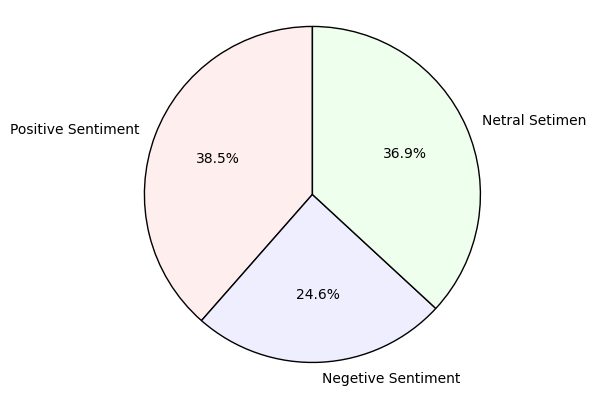

In [20]:
sentiments = ['Positive Sentiment', 'Negetive Sentiment', 'Netral Setimen'] 
slices = [(data_jumlah_sama['klasifikasi'] == 1).sum(), (data_jumlah_sama['klasifikasi'] == 0).sum(), (data_jumlah_sama['klasifikasi'] == 2).sum()] 
colors = ['#ffeeee', '#eeeeff', '#eeffee']
fig1, ax1 = plt.subplots()
_, _, autotexts = ax1.pie(slices, labels=sentiments, autopct='%1.1f%%', startangle=90, colors=colors,
                          wedgeprops={'edgecolor': 'black'})

# Memberikan outline berwarna hitam pada setiap bagian pie chart
for autotext in autotexts:
    autotext.set_color('black')

# Mengatur aspek lingkaran agar terlihat seperti pie
ax1.axis('equal')

# Menampilkan pie chart
plt.show()

### Most Used Words

<Figure size 3840x2880 with 0 Axes>

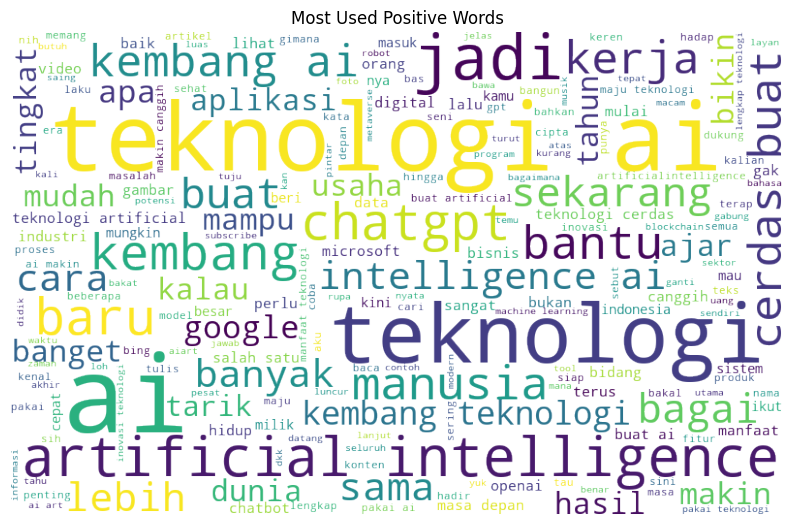

In [21]:
positive_words =' '.join([' '.join(text) for text in data_jumlah_sama['processed_tweet'][data_jumlah_sama['klasifikasi'] == 1]])
wordcloud = WordCloud(width=800, height=500, random_state=21,
            max_font_size=110,background_color="rgba(255, 255, 255, 0)"
            , mode="RGBA").generate(positive_words)
plt.figure(dpi=600)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title("Most Used Positive Words")
plt.show()

<Figure size 3840x2880 with 0 Axes>

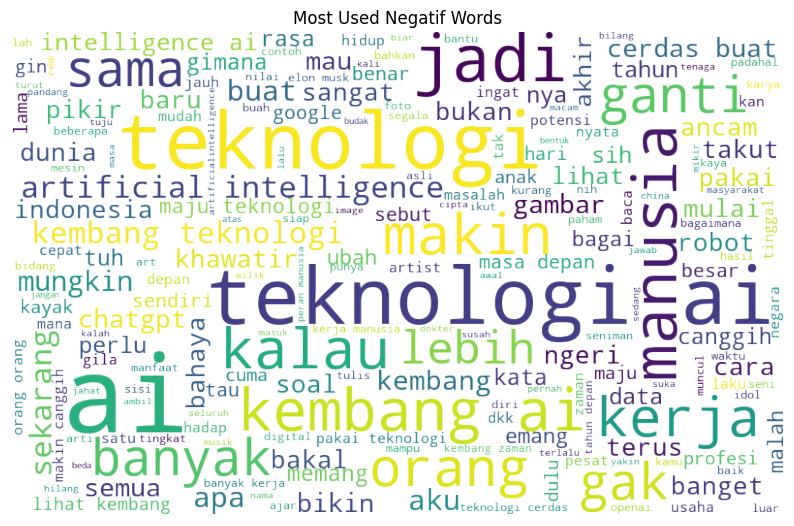

In [22]:
netral_words =' '.join([' '.join(text) for text in data_jumlah_sama['processed_tweet'][data_jumlah_sama['klasifikasi'] == 0]])
wordcloud = WordCloud(width=800, height=500, random_state=21,
            max_font_size=110,background_color="rgba(255, 255, 255, 0)"
            , mode="RGBA").generate(netral_words)
plt.figure(dpi=600)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title("Most Used Negatif Words")
plt.show()

In [23]:
# netral_words =' '.join([' '.join(text) for text in data_jumlah_sama['processed_tweet'][data_jumlah_sama[classfier] == 2]])
# wordcloud = WordCloud(width=800, height=500, random_state=21,
#             max_font_size=110,background_color="rgba(255, 255, 255, 0)"
#             , mode="RGBA").generate(netral_words)
# plt.figure(dpi=600)
# plt.figure(figsize=(10, 7))
# plt.imshow(wordcloud, interpolation="bilinear")
# plt.axis('off')
# plt.title("Most Used Netral Words")
# plt.show()

# Feature Extraction

In [24]:
data_jumlah_sama['processed_tweet'] = data_jumlah_sama['processed_tweet'].apply(lambda x: ' '.join(x))

N-gram

In [25]:
from sklearn.feature_extraction.text import CountVectorizer

count_vectorizer = CountVectorizer(ngram_range=(1,2))    # Unigram and Bigram
final_vectorized_data = count_vectorizer.fit_transform(data_jumlah_sama['processed_tweet'])
count_vectorizer.fit(data_jumlah_sama['processed_tweet'])

# print(len(count_vectorizer.get_feature_names_out()))
# print(final_vectorized_data)

CountVectorizer(ngram_range=(1, 2))

In [26]:
print(len(data_jumlah_sama['processed_tweet']))
print(len(data_jumlah_sama[classfier]))
print(data_jumlah_sama[classfier].dtype)


2178
2178
int32


TF-IDF

In [27]:
from sklearn.feature_extraction.text import TfidfVectorizer 

# tf_idf_vectorizer = TfidfVectorizer(use_idf=True, ngram_range=(1,2))
# tf_idf_vectorizer.fit(data_jumlah_sama['processed_tweet'])
# final_vectorized_data = tf_idf_vectorizer.fit_transform(data_jumlah_sama['processed_tweet'])

# print(final_vectorized_data)
# print(len(tf_idf_vectorizer.get_feature_names_out()))

Information Gain

In [28]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif, mutual_info_regression
from sklearn.preprocessing import LabelEncoder

# # data[classfier] = data[classfier].map({0:"Negatif", 1:"Positif", 2:"Netral"})
encoder = LabelEncoder()
target_encoded = encoder.fit_transform(data_jumlah_sama[classfier])

info_gains = mutual_info_classif(final_vectorized_data, target_encoded, discrete_features=True)
sorted_features = sorted(range(final_vectorized_data.shape[1]), key=lambda i: info_gains[i], reverse=True)
K = 5100
selected_features = sorted_features[:K]
final_vectorized_data= final_vectorized_data[:, selected_features]
labels = data_jumlah_sama[classfier]

Split

In [29]:
from sklearn.model_selection import train_test_split
import random

X_train, X_test, y_train, y_test = train_test_split(final_vectorized_data, labels,
                                                    test_size=0.2, random_state=4)

random.seed(4)
indices = list(range(final_vectorized_data.shape[0]))
random.shuffle(indices)

train_data = final_vectorized_data[indices]
train_label = [list(labels)[x] for x in indices] 

In [30]:
print("X_train_shape : ",X_train.shape)
print("X_test_shape : ",X_test.shape)
print("y_train_shape : ",y_train.shape)
print("y_test_shape : ",y_test.shape)

X_train_shape :  (1742, 5100)
X_test_shape :  (436, 5100)
y_train_shape :  (1742,)
y_test_shape :  (436,)


In [31]:
from sklearn.naive_bayes import MultinomialNB  # Naive Bayes Classifier

naive_bayes = MultinomialNB()
nb_scores = cross_val_score(naive_bayes, train_data, train_label, cv=10)
print("Akurasi setiap fold:", nb_scores)
print("Rata-rata akurasi:", nb_scores.mean()*100)
predicted_naive = cross_val_predict(naive_bayes, train_data, train_label, cv=10)


# model_naive = MultinomialNB().fit(X_train, y_train) 
# predicted_naive = model_naive.predict(X_test)

Akurasi setiap fold: [0.68348624 0.67889908 0.72477064 0.75229358 0.71559633 0.72477064
 0.69266055 0.64220183 0.7235023  0.71889401]
Rata-rata akurasi: 70.57075212446625


[Naive Bayes]
Accuracy:  70.56932966023875
Precision:  [65.67164179 75.56615018 68.61768369]
Recall:  [73.79454927 74.50058754 64.82352941]
F-measure:  [69.49654492 75.0295858  66.66666667]


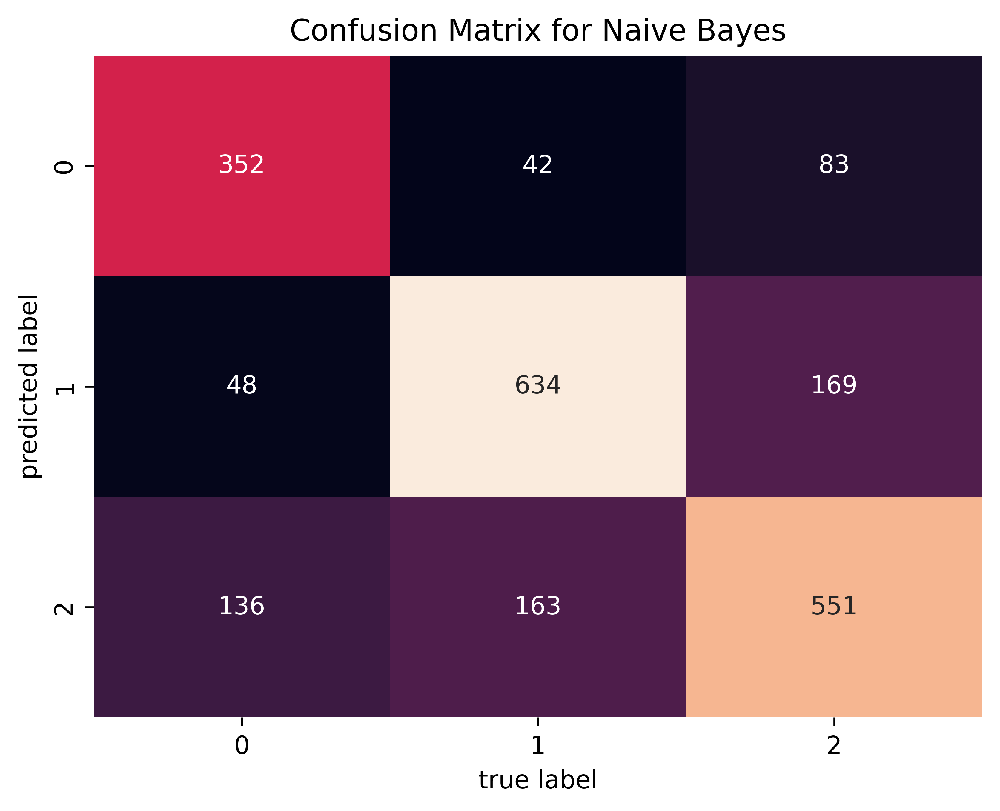

In [32]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

mat = confusion_matrix(train_label, predicted_naive)
naive_acc = accuracy_score(predicted_naive, train_label)
naive_pre = np.diag(mat)/np.sum(mat,axis=1)
naive_recall = np.diag(mat) / np.sum(mat, axis=0)
naive_f1 = 2 * naive_pre * naive_recall / (naive_pre + naive_recall)

# naive_pre = precision_score(predicted_naive, train_label)
# naive_recall = recall_score(predicted_naive, train_label)
# naive_f1 = f1_score(predicted_naive, train_label)
print("[Naive Bayes]")
print("Accuracy: ",naive_acc*100)
print("Precision: ",naive_pre*100)
print("Recall: ",naive_recall*100)
print("F-measure: ",naive_f1*100)


plt.figure(dpi=600)
sns.heatmap(mat.T, annot=True, fmt='d', cbar=False)

plt.title('Confusion Matrix for Naive Bayes')
plt.xlabel('true label')
plt.ylabel('predicted label')
plt.show()

[Naive Bayes]
Accuracy:  72.01834862385321
Precision:  [63.88888889 80.70175439 68.15286624]
Recall:  [75.82417582 77.52808989 64.07185629]
F-measure:  [69.34673367 79.08309456 66.04938272]


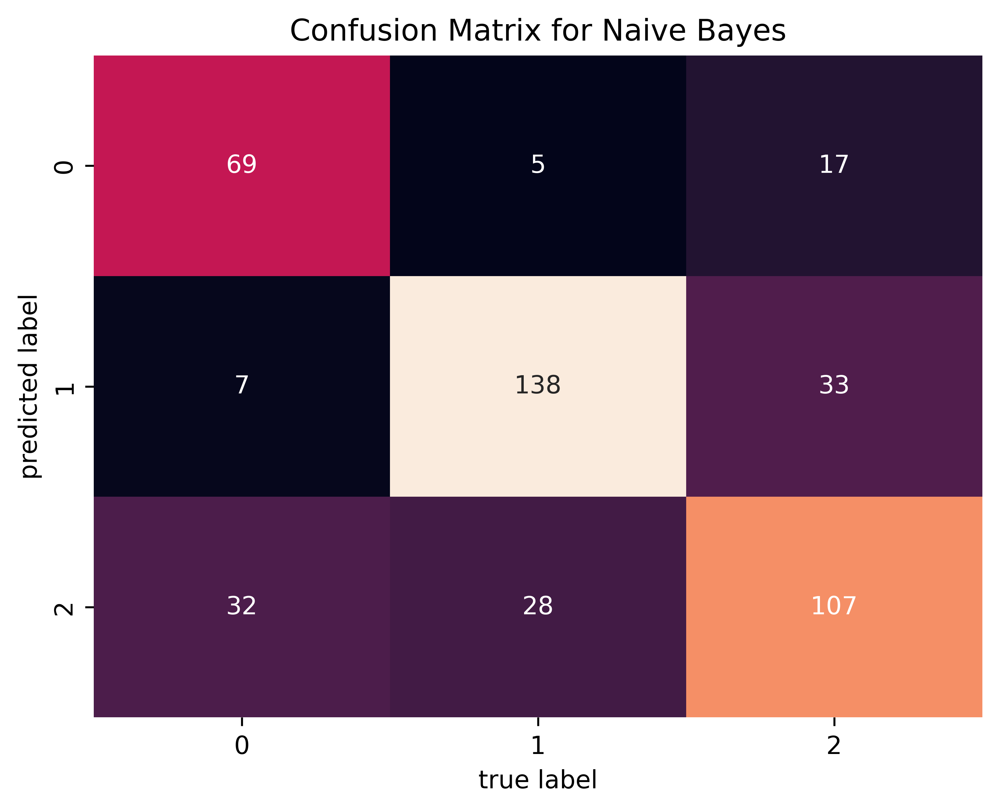

In [33]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

naive_bayes = MultinomialNB()
naive_bayes.fit(X_train, y_train) 
predict_naive = naive_bayes.predict(X_test)
mat = confusion_matrix(y_test, predict_naive)

naive_acc = accuracy_score(predict_naive, y_test)
naive_pre = np.diag(mat)/np.sum(mat,axis=1)
naive_recall = np.diag(mat) / np.sum(mat, axis=0)
naive_f1 = 2 * naive_pre * naive_recall / (naive_pre + naive_recall)
print("[Naive Bayes]")
print("Accuracy: ",naive_acc*100)
print("Precision: ",naive_pre*100)
print("Recall: ",naive_recall*100)
print("F-measure: ",naive_f1*100)


plt.figure(dpi=600)
sns.heatmap(mat.T, annot=True, fmt='d', cbar=False)

plt.title('Confusion Matrix for Naive Bayes')
plt.xlabel('true label')
plt.ylabel('predicted label')
plt.show()

In [34]:
for test, lbl in zip(y_test, predicted_naive):
    print(test, lbl, end=" | ")

0 1 | 2 1 | 0 2 | 2 1 | 0 1 | 1 1 | 2 2 | 0 1 | 0 2 | 1 1 | 1 1 | 2 0 | 2 1 | 2 1 | 1 2 | 1 1 | 0 2 | 1 0 | 1 1 | 1 2 | 2 1 | 1 2 | 1 0 | 2 1 | 2 2 | 2 1 | 0 1 | 2 1 | 2 1 | 0 1 | 0 2 | 0 2 | 1 2 | 1 1 | 2 2 | 1 2 | 1 1 | 1 2 | 2 1 | 2 0 | 2 2 | 0 1 | 2 1 | 1 0 | 0 2 | 1 1 | 0 0 | 1 2 | 1 2 | 2 1 | 2 2 | 2 2 | 1 1 | 2 0 | 1 2 | 2 2 | 1 2 | 1 2 | 1 2 | 2 2 | 2 2 | 2 1 | 1 1 | 0 1 | 1 1 | 1 2 | 1 0 | 0 1 | 1 2 | 2 1 | 2 0 | 1 2 | 2 2 | 1 0 | 2 0 | 2 1 | 0 2 | 0 2 | 0 1 | 1 0 | 1 0 | 1 0 | 2 1 | 2 2 | 0 2 | 0 1 | 1 1 | 1 2 | 0 0 | 0 0 | 2 2 | 0 1 | 1 1 | 1 0 | 0 2 | 0 1 | 2 1 | 2 1 | 2 2 | 2 0 | 2 0 | 1 1 | 1 2 | 2 2 | 2 1 | 2 1 | 2 1 | 2 1 | 1 1 | 2 2 | 0 0 | 2 2 | 1 2 | 1 1 | 1 2 | 2 1 | 1 0 | 0 1 | 0 0 | 0 0 | 1 1 | 2 1 | 1 1 | 0 0 | 1 0 | 2 2 | 0 1 | 0 1 | 2 1 | 0 1 | 2 2 | 1 0 | 1 0 | 2 1 | 2 0 | 1 2 | 0 0 | 2 2 | 0 1 | 2 1 | 2 0 | 2 0 | 0 0 | 1 0 | 1 2 | 0 1 | 2 2 | 1 1 | 2 1 | 1 1 | 2 0 | 1 2 | 1 2 | 2 1 | 0 2 | 2 2 | 1 2 | 1 1 | 1 2 | 2 2 | 2 2 | 2 1 | 1 1 | 0 2 | 1 1 | 2 1 | 1 1 

## Support Vector Machine

[Linier Support Vector Machine]
Accuracy:  62.38532110091744
Precision:  [56.48148148 64.9122807  63.69426752]
Recall:  [64.89361702 68.51851852 55.55555556]
F-measure:  [60.3960396  66.66666667 59.34718101]


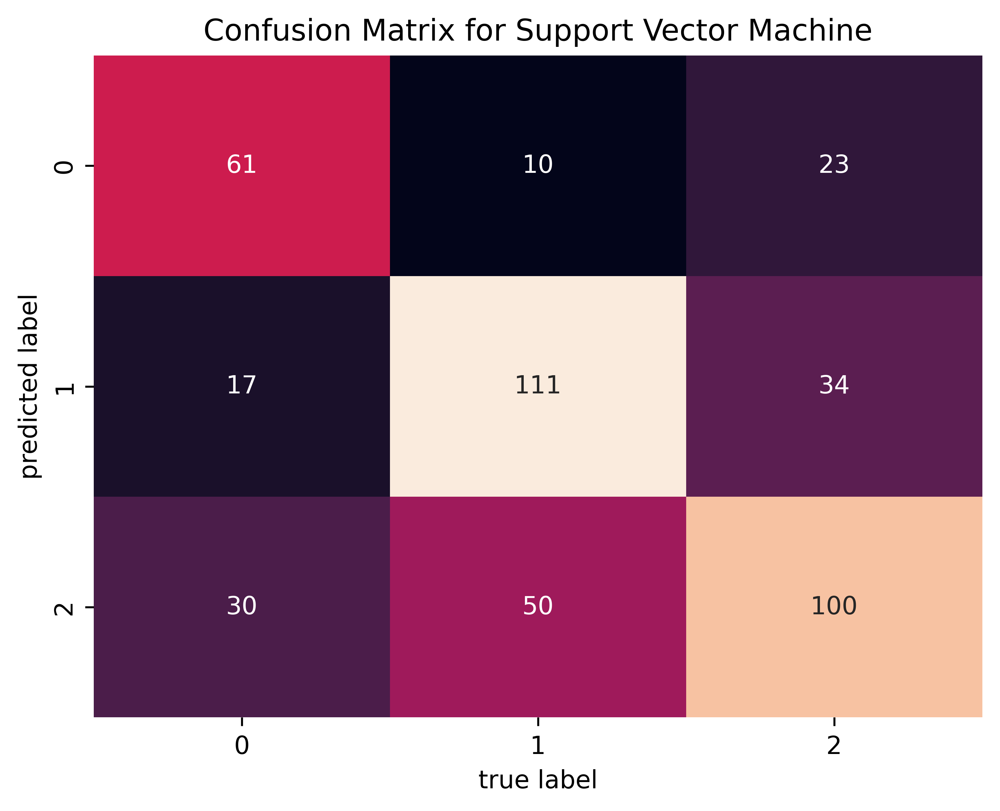

In [35]:
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC

model_svc_linier = SVC(kernel='linear', C=1,decision_function_shape='ovo')
model_svc_linier.fit(X_train, y_train) 
predict_svm_linier = model_svc_linier.predict(X_test)
mat = confusion_matrix(y_test, predict_svm_linier)

svm_acc = accuracy_score(predict_svm_linier, y_test)
svm_pre = np.diag(mat)/np.sum(mat,axis=1)
svm_recall = np.diag(mat) / np.sum(mat, axis=0)
svm_f1 = 2 * svm_pre * svm_recall / (svm_pre + svm_recall)

# svm_pre = precision_score(predict_svm_linier, train_label)
# svm_recall = recall_score(predict_svm_linier, train_label)
# svm_f1 = f1_score(predict_svm_linier, train_label)

print("[Linier Support Vector Machine]")
print("Accuracy: ",svm_acc*100)
print("Precision: ",svm_pre*100)
print("Recall: ",svm_recall*100)
print("F-measure: ",svm_f1*100)


plt.figure(dpi=600)
sns.heatmap(mat.T, annot=True, fmt='d', cbar=False)

plt.title('Confusion Matrix for Support Vector Machine')
plt.xlabel('true label')
plt.ylabel('predicted label')
plt.show()

In [36]:
model_svc_linier = SVC(kernel='linear', C=1,decision_function_shape='ovo')
svc_scores = cross_val_score(model_svc_linier, train_data, train_label, cv=10)
print("Akurasi setiap fold:", svc_scores)
print("Rata-rata akurasi:", svc_scores.mean()*100)
predicted_svc_linier = cross_val_predict(model_svc_linier, train_data, train_label, cv=10)


Akurasi setiap fold: [0.56880734 0.6146789  0.62385321 0.62385321 0.61926606 0.5733945
 0.62844037 0.55504587 0.58064516 0.66359447]
Rata-rata akurasi: 60.515790808776906


[SVM]
Accuracy:  60.51423324150596
Precision:  [53.54477612 64.71990465 60.77210461]
Recall:  [61.85344828 64.18439716 56.22119816]
F-measure:  [57.4        64.45103858 58.40813884]


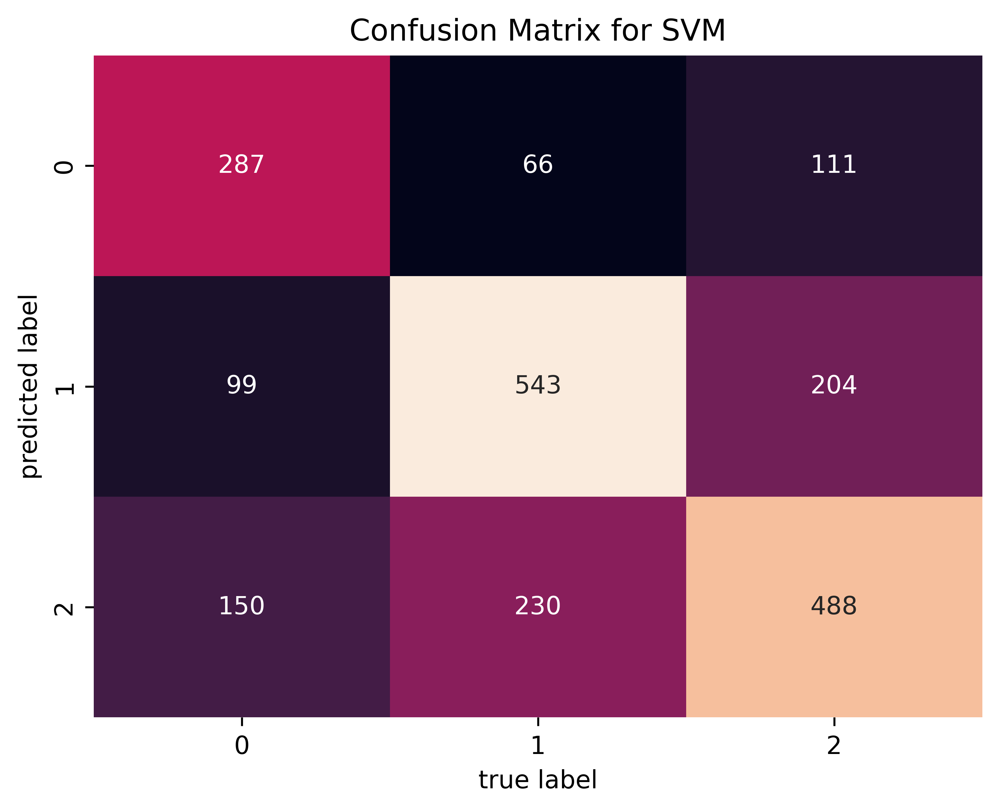

In [37]:
from sklearn.metrics import confusion_matrix

mat = confusion_matrix(train_label, predicted_svc_linier)
svm_acc = accuracy_score(predicted_svc_linier, train_label)
svm_pre = np.diag(mat)/np.sum(mat,axis=1)
svm_recall = np.diag(mat) / np.sum(mat, axis=0)
svm_f1 = 2 * svm_pre * svm_recall / (svm_pre + svm_recall)
print("[SVM]")
print("Accuracy: ",svm_acc*100)
print("Precision: ",svm_pre*100)
print("Recall: ",svm_recall*100)
print("F-measure: ",svm_f1*100)


plt.figure(dpi=600)
sns.heatmap(mat.T, annot=True, fmt='d', cbar=False)

plt.title('Confusion Matrix for SVM')
plt.xlabel('true label')
plt.ylabel('predicted label')
plt.show()

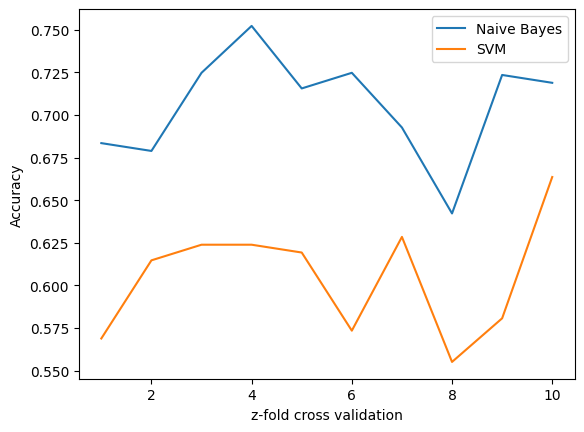

In [38]:
import matplotlib.pyplot as plt

# Data untuk sumbu x dan y
x = list(range(1,11))
y1 = nb_scores
y2 = svc_scores

# Membuat grafik garis
plt.plot(x, y1, label='Naive Bayes')
plt.plot(x, y2, label='SVM')

# Menambahkan label pada sumbu x dan y
plt.xlabel('z-fold cross validation')
plt.ylabel('Accuracy')

# Menambahkan legenda
plt.legend()

In [39]:
# import matplotlib.pyplot as plt

# ngram_graph = CountVectorizer(ngram_range=(1,2))    # Unigram and Bigram
# ngram_graph_data = ngram_graph.fit_transform(data_jumlah_sama['processed_tweet'])
# tf_idf_graph = TfidfVectorizer(use_idf=True)
# tf_idf_graph_data = tf_idf_graph.fit_transform(data_jumlah_sama['processed_tweet'])

# from sklearn.feature_selection import SelectKBest, mutual_info_classif, mutual_info_regression
# from sklearn.preprocessing import LabelEncoder

# encoder = LabelEncoder()
# target_encoded = encoder.fit_transform(data_jumlah_sama[classfier])

# random.seed(4)
# indices = list(range(final_vectorized_data.shape[0]))
# random.shuffle(indices)

# ngram_graph_data = ngram_graph_data[indices]
# tf_idf_graph_data = tf_idf_graph_data[indices]
# test_lbl = [list(target_encoded)[x] for x in indices] 

# selector_info_gain = SelectKBest(score_func=mutual_info_classif, k=30)

# tf_idf_infogain = selector_info_gain.fit_transform(tf_idf_graph_data, test_lbl)
# ngram_infogain = selector_info_gain.fit_transform(ngram_graph_data, test_lbl)

# naive_bayes = MultinomialNB()


# x = list(range(1,11))
# y1 = cross_val_score(naive_bayes, tf_idf_graph_data, test_lbl, cv=10)
# y2 = cross_val_score(naive_bayes, ngram_graph_data, test_lbl, cv=10)
# y3 = cross_val_score(naive_bayes, tf_idf_infogain, test_lbl, cv=10)
# y4 = cross_val_score(naive_bayes, ngram_infogain, test_lbl, cv=10)

# # Membuat grafik garis
# plt.plot(x, y1, label='TF-IDF')
# plt.plot(x, y2, label='N-Gram')
# plt.plot(x, y3, label='TF-IDF+Information Gain')
# plt.plot(x, y4, label='N-Gram+Information Gain')

# # Menambahkan label pada sumbu x dan y
# plt.xlabel('z-fold cross validation')
# plt.ylabel('Accuracy')
# plt.title("Naive Bayes")

# # Menambahkan legenda
# plt.legend()

In [40]:
# import matplotlib.pyplot as plt

# ngram_graph = CountVectorizer(ngram_range=(1,2))    # Unigram and Bigram
# ngram_graph_data = ngram_graph.fit_transform(data_jumlah_sama['processed_tweet'])
# tf_idf_graph = TfidfVectorizer(use_idf=True)
# tf_idf_graph_data = tf_idf_graph.fit_transform(data_jumlah_sama['processed_tweet'])

# from sklearn.feature_selection import SelectKBest, mutual_info_classif, mutual_info_regression
# from sklearn.preprocessing import LabelEncoder

# encoder = LabelEncoder()
# target_encoded = encoder.fit_transform(data_jumlah_sama[classfier])

# random.seed(4)
# indices = list(range(final_vectorized_data.shape[0]))
# random.shuffle(indices)

# ngram_graph_data = ngram_graph_data[indices]
# tf_idf_graph_data = tf_idf_graph_data[indices]
# test_lbl = [list(target_encoded)[x] for x in indices] 

# selector_info_gain = SelectKBest(score_func=mutual_info_classif)

# tf_idf_infogain = selector_info_gain.fit_transform(tf_idf_graph_data, test_lbl)
# ngram_infogain = selector_info_gain.fit_transform(ngram_graph_data, test_lbl)


# # tf_idf_infogain = mutual_info_classif(tf_idf_graph_data, test_lbl, discrete_features=True)
# # ngram_infogain = mutual_info_classif(tf_idf_graph_data, test_lbl, discrete_features=True)

# svm_model = SVC(kernel='linear', C=1,decision_function_shape='ovo')


# x = list(range(1,11))
# y1 = cross_val_score(svm_model, tf_idf_graph_data, test_lbl, cv=10)
# y2 = cross_val_score(svm_model, ngram_graph_data, test_lbl, cv=10)
# y3 = cross_val_score(svm_model, tf_idf_infogain, test_lbl, cv=10)
# y4 = cross_val_score(svm_model, ngram_infogain, test_lbl, cv=10)

# # Membuat grafik garis
# plt.plot(x, y1, label='TF-IDF')
# plt.plot(x, y2, label='N-Gram')
# plt.plot(x, y3, label='TF-IDF+Information Gain')
# plt.plot(x, y4, label='N-Gram+Information Gain')

# # Menambahkan label pada sumbu x dan y
# plt.xlabel('z-fold cross validation')
# plt.ylabel('Accuracy')
# plt.title("SVM")

# # Menambahkan legenda
# plt.legend()

In [41]:
# tf_idf_graph = TfidfVectorizer(use_idf=True)
# tf_idf_graph.fit(data_jumlah_sama['processed_tweet'])
# tf_idf_graph_data = tf_idf_graph.fit_transform(data_jumlah_sama['processed_tweet'])

# encoder = LabelEncoder()
# target_encoded = encoder.fit_transform(data_jumlah_sama[classfier])

# ngram_graph_data = ngram_graph_data[indices]
# tf_idf_graph_data = tf_idf_graph_data[indices]
# test_lbl = [list(target_encoded)[x] for x in indices] 

# selector_info_gain = SelectKBest(score_func=mutual_info_classif)


# tf_idf_infogain = selector_info_gain.fit_transform(tf_idf_graph_data, test_lbl)
# ngram_infogain = selector_info_gain.fit_transform(ngram_graph_data, test_lbl)


# tfidf_info_gains = mutual_info_classif(ngram_graph_data, test_lbl, discrete_features=True)
# ngram_info_gains = mutual_info_classif(ngram_graph_data, test_lbl, discrete_features=True)
# tfidf_sorted_features = sorted(range(tf_idf_graph_data.shape[1]), key=lambda i: tfidf_info_gains[i], reverse=True)
# ngram_sorted_features = sorted(range(ngram_graph_data.shape[1]), key=lambda i: ngram_info_gains[i], reverse=True)

# selected_features_info_gain = [tf_idf_graph.get_feature_names_out()[x] for x in tfidf_sorted_features]
# print(selected_features_info_gain)
# print(sorted(tfidf_info_gains))
    # K = int(_x*500)
    # tfidf_selected_features = tfidf_sorted_features[:K]
    # ngram_selected_features = ngram_sorted_features[:K]

    # tf_idf_infogain = tf_idf_graph_data[:, tfidf_selected_features]
    # ngram_infogain = ngram_graph_data[:, ngram_selected_features]
    # tf_idf_predict = cross_val_predict(svm_model, tf_idf_graph_data, test_lbl, cv=10)
    # ngram_predict = cross_val_predict(svm_model, ngram_graph_data, test_lbl, cv=10)
    # y1.append(accuracy_score(tf_idf_predict, test_lbl))
    # y2.append(accuracy_score(ngram_predict, test_lbl))
    # Melakukan seleksi fitur menggunakan mutual information


In [42]:
# import matplotlib.pyplot as plt
# from sklearn.feature_selection import SelectKBest, mutual_info_classif, mutual_info_regression
# from sklearn.preprocessing import LabelEncoder
# import warnings
# warnings.filterwarnings("ignore")

# count_vectorizer = CountVectorizer(ngram_range=(1,2))    # Unigram and Bigram
# count_vectorizer_matrix = count_vectorizer.fit_transform(data_jumlah_sama['processed_tweet'])

# random.seed(4)
# indices = list(range(count_vectorizer_matrix.shape[0]))
# random.shuffle(indices)

# labels = list(data_jumlah_sama[classfier])

# count_vectorizer_matrix = count_vectorizer_matrix[indices]
# labels = [labels[x] for x in indices] 

# svm_model = SVC(kernel='linear', C=1,decision_function_shape='ovo')
# tf_idf_vectorizer = TfidfVectorizer(use_idf=True)
# tf_idf_matrix = tf_idf_vectorizer.fit_transform(data_jumlah_sama['processed_tweet'])

# tf_idf_matrix = tf_idf_matrix[indices]


# x = np.array(range(1,200))*20
# y1 = []
# y2 = []

# for _x in x:
#     selector = SelectKBest(score_func=mutual_info_classif, k=_x)
#     selected_features = selector.fit_transform(tf_idf_matrix, labels)
#     tf_idf_predict = cross_val_predict(svm_model, selected_features, labels, cv=10)
#     y1.append(accuracy_score(tf_idf_predict, labels))
#     selected_features = selector.fit_transform(count_vectorizer_matrix, labels)
#     countvect_predict = cross_val_predict(svm_model, selected_features, labels, cv=10)
#     y2.append(accuracy_score(countvect_predict, labels))
#     print(_x, 'of', x[-1], f"({_x/x[-1]*100}%)")

# # Membuat grafik garis
# plt.plot(x, y1, label='TF-IDF')
# plt.plot(x, y2, label='Count Vectorizer')

# # Menambahkan label pada sumbu x dan y
# plt.xlabel('K')
# plt.ylabel('Accuracy')
# plt.title("SVM")

# # Menambahkan legenda
# plt.legend()

In [43]:
# import math
# pdTabelAccuracy = pd.DataFrame({'K': x, "TF-IDF": y1, "CountVectorizer":y2})
# pdTabelAccuracy.to_csv("2-SVM+TF-IDF+CountVector+InfoGain.csv")

In [44]:
# import matplotlib.pyplot as plt
# from sklearn.feature_selection import SelectKBest, mutual_info_classif, mutual_info_regression
# from sklearn.preprocessing import LabelEncoder

# naive_model = MultinomialNB()

# count_vectorizer = CountVectorizer(ngram_range=(1,2))    # Unigram and Bigram
# count_vectorizer_matrix = count_vectorizer.fit_transform(data_jumlah_sama['processed_tweet'])
# tf_idf_vectorizer = TfidfVectorizer(use_idf=True)
# tf_idf_matrix = tf_idf_vectorizer.fit_transform(data_jumlah_sama['processed_tweet'])

# labels = list(data_jumlah_sama[classfier])
# x = np.array(range(1,200))*20
# y1 = []
# y2 = []

# random.seed(4)
# indices = list(range(count_vectorizer_matrix.shape[0]))
# random.shuffle(indices)

# count_vectorizer_matrix = count_vectorizer_matrix[indices]
# tf_idf_matrix = tf_idf_matrix[indices]
# labels = [labels[x] for x in indices] 

# for _x in x:
#     selector = SelectKBest(score_func=mutual_info_classif, k=_x)
#     selected_features = selector.fit_transform(tf_idf_matrix, labels)
#     tf_idf_predict = cross_val_predict(naive_model, selected_features, labels, cv=10)
#     y1.append(accuracy_score(tf_idf_predict, labels))
#     selected_features = selector.fit_transform(count_vectorizer_matrix, labels)
#     countvect_predict = cross_val_predict(naive_model, selected_features, labels, cv=10)
#     y2.append(accuracy_score(countvect_predict, labels))
#     print(_x, 'of', x[-1], f"({_x/x[-1]*100}%)")

# # Membuat grafik garis
# plt.plot(x, y1, label='TF-IDF')
# plt.plot(x, y2, label='Count Vectorizer')

# # Menambahkan label pada sumbu x dan y
# plt.xlabel('K')
# plt.ylabel('Accuracy')
# plt.title("Naive Bayes")

# # Menambahkan legenda
# plt.legend()

In [45]:
# import math
# pdTabelAccuracy = pd.DataFrame({'K': x, "TF-IDF": y1, "CountVectorizer":y2})
# pdTabelAccuracy.to_csv("2-Naive+TF-IDF+CountVector+InfoGain.csv")

In [46]:

# # # Mengurutkan data mulai dari terbesar
# # sorted_indices = tf_idf_graph_data.indices[tf_idf_graph_data.indptr[0]:tf_idf_graph_data.indptr[1]]
# # sorted_values = tf_idf_graph_data.data[tf_idf_graph_data.indptr[0]:tf_idf_graph_data.indptr[1]]

# # sorted_data = sorted(zip(sorted_indices, sorted_values), key=lambda x: x[1], reverse=True)
# # sorted_indices, sorted_values = zip(*sorted_data)

# # print(sorted_values)

# # Mengambil nilai maksimum dan indeksnya
# max_value = tf_idf_graph_data.max()
# max_index = tf_idf_graph_data.argmax()

# # Mengkonversi indeks menjadi col_indices dan row_indices
# col_index = max_index % tf_idf_graph_data.shape[1]
# row_index = max_index // tf_idf_graph_data.shape[1]

# print("Nilai maksimum:", max_value)
# print("col_indices:", col_index)
# print("row_indices:", row_index)
# print(tf_idf_graph.get_feature_names_out()[col_index])

In [47]:
tf_idf_vectorizer = TfidfVectorizer(use_idf=True)
tf_idf_matrix = tf_idf_vectorizer.fit_transform(data_jumlah_sama['processed_tweet'])

# Melakukan seleksi fitur menggunakan mutual information
selector = SelectKBest(score_func=mutual_info_classif, k=50)
selected_features = selector.fit_transform(tf_idf_matrix, data_jumlah_sama[classfier])

# Mendapatkan indeks fitur yang dipilih
selected_feature_indices = selector.get_support(indices=True)

# Mendapatkan daftar fitur dengan bobot tertinggi
selected_feature_names = tf_idf_vectorizer.get_feature_names_out()[selected_feature_indices]

print("Fitur dengan bobot tertinggi:")
for feature in selected_feature_names:
    print(feature)

c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(ms

Fitur dengan bobot tertinggi:
ai
apa
artificial
bagai
bakal
banget
bantu
banyak
baru
beberapa
bikin
buat
bukan
canggih
cara
cerdas
chatgpt
data
depan
dunia
gak
gambar
ganti
google
hasil
intelligence
jadi
kalau
kembang
kerja
lebih
lihat
maju
makin
manfaat
manusia
masa
mau
mulai
mungkin
orang
pakai
sama
sangat
satu
sekarang
semua
tahun
teknologi
terus


c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(ms

Test Predict

In [77]:
# input_text = pd.DataFrame({
#     "Contoh": [
#         "Perkembangan AI menyenangkan",
#         "Saya takut dengan perkembangan ai",
#         "Perkembangan AI mengerikan",
#         "Pekerjaan seniman terancam direbut AI",
#         "Banyak pekerjaan kita yang akan direbut oleh AI",
#         "AI akan mempermudah kita",
#         "AI merupakan mesin pembelajaran NLP",
#         "Elon Musk katakan AI lebih bahaya daripada nuklir",
#         "AI sangat membantu pekerjaan",
#         "Melihat perkembangan AI, bagaimana nasib ke depannya?",
#         "Sekarang ini banyak informasi palsu karena AI",
#         "Melihat perkembangan AI sekarang, bingung mau takut atau kagum",
#         "Bagaimana menurut kalian perkembangan AI sekarang?",
#         "Karena perkembangan AI, banyak konten deep fake",
#         "Manusia akan digantikan robot",
#         "AI sangat membantu dalam mengerjakan tugas",
#         "Para seniman terbantu dengan teknologi AI",
#         "Presenter pada berita MetroTV sudah mengimplementasikan AI",
#         ],
#     "Aktual":[
#         "Positif",
#         "Negatif",
#         "Negatif",
#         "Negatif",
#         "Negatif",
#         "Positif",
#         "Netral",
#         "Negatif",
#         "Positif",
#         "Netral",
#         "Negatif",
#         "Netral",
#         "Netral",
#         "Negatif",
#         "Negatif",
#         "Positif",
#         "Positif",
#         "Positif",

#     ]
# })

input_text = pd.read_csv("./New Sentimen.csv")

processed_text = input_text.copy()
print(processed_text)
processed_text['Contoh'] = np.vectorize(process_tweet)(processed_text['Contoh'])
processed_text['Contoh'] = np.vectorize(normalization)(processed_text['Contoh'])
processed_text['Contoh'] = np.vectorize(stemmer.stem)(processed_text['Contoh'])
processed_text['Contoh'] = processed_text['Contoh'].apply(lambda x: ' '.join([i for i in x.split() if i not in stopwords]))


    No.                                             Contoh   Aktual
0     1  Era modern AI ditandai dengan perkembangan tek...  Positif
1     2  Yang menarik dalam wawancara malam ini, saat P...  Positif
2     3  Ia sangat mendukung perkembangan teknologi. Se...  Positif
3     4  Perkembangan AI sama saja dengan perkembangan ...  Negatif
4     5  Perkembangan AI dalam industri kripto membuka ...  Negatif
5     6  sebelum kenal AI ada tp oknumnya gk banyak. TA...  Negatif
6     7  sudah ada dari dulu. AI bukan teknologi baru, ...  Negatif
7     8                     Udah parah nih perkembangan ai  Negatif
8     9  Kalau sekarang media pembelajaran harus sesuai...  Positif
9    10  Dalam beberapa tahun terakhir, kecerdasan buat...  Positif
10   11  Perkembangan kecerdasan buatan atau AI semakin...  Negatif
11   12  Gue mendukung perkembangan AI dalam hal pembua...  Positif
12   13  Katanya, ada AI yg khusus generator dari gamba...  Negatif
13   14  1. Keep up to date terhadap perkembanga

Naive Bayes Predict

In [92]:
tf_idf_vectorizer = TfidfVectorizer(use_idf=True, ngram_range=(1,2))
train_vectorizer = tf_idf_vectorizer.fit_transform(data_jumlah_sama['processed_tweet'])

# count_vectorizer = CountVectorizer()    # Unigram and Bigram
# train_vectorizer = count_vectorizer.fit_transform(data_jumlah_sama['processed_tweet'])

encoder = LabelEncoder()
target_encoded = encoder.fit_transform(data_jumlah_sama[classfier])

info_gains = mutual_info_classif(train_vectorizer, target_encoded, discrete_features=True)
sorted_features = sorted(range(train_vectorizer.shape[1]), key=lambda i: info_gains[i], reverse=True)
K = 3700
selected_features = sorted_features[:K]
train_vectorizer = train_vectorizer[:, selected_features]

random.seed(4)
indices = list(range(train_vectorizer.shape[0]))
random.shuffle(indices)

train_data = train_vectorizer[indices]
train_label = [list(data_jumlah_sama[classfier])[x] for x in indices] 

sentimen = {0: "Negatif", 1: "Positif", 2: "Netral"}

# # Test

# count_vectorizer = CountVectorizer()    # Unigram and Bigram
# count_vectorizer.fit(data_jumlah_sama['processed_tweet'])
# test_vectorizer = count_vectorizer.transform(processed_text['Contoh'])  # Menggunakan transform, bukan fit

tf_idf_vectorizer = TfidfVectorizer(use_idf=True, ngram_range=(1,2))
tf_idf_vectorizer.fit(data_jumlah_sama['processed_tweet'])
test_vectorizer = tf_idf_vectorizer.transform(processed_text['Contoh'])

test_vectorizer = test_vectorizer[:, selected_features]

model_naive = MultinomialNB()
model_naive.fit(train_data, train_label)
predicted_naive = model_naive.predict(test_vectorizer)

processed_text['Predict'] = predicted_naive
processed_text['Predict'] = processed_text['Predict'].apply(lambda x: sentimen[x])
print(processed_text)
print("Akurasi:",(processed_text['Aktual'] == processed_text['Predict']).sum()/len(processed_text['Aktual']))

# mat = confusion_matrix(data_jumlah_sama[classfier], predicted_naive)
# svm_acc = accuracy_score(predicted_naive, data_jumlah_sama[classfier])
# svm_pre = np.diag(mat)/np.sum(mat,axis=1)
# svm_recall = np.diag(mat) / np.sum(mat, axis=0)
# svm_f1 = 2 * svm_pre * svm_recall / (svm_pre + svm_recall)
# print("[SVM]")
# print("Accuracy: ",svm_acc*100)
# print("Precision: ",svm_pre*100)
# print("Recall: ",svm_recall*100)
# print("F-measure: ",svm_f1*100)


# plt.figure(dpi=600)
# sns.heatmap(mat.T, annot=True, fmt='d', cbar=False)

# plt.title('Confusion Matrix for Naive Bayes')
# plt.xlabel('true label')
# plt.ylabel('predicted label')


c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\HP\Envs\DataMining\lib\site-packages\sklearn\metrics\cluster\_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(ms

    No.                                             Contoh   Aktual  Predict
0     1  era modern ai tanda kembang teknologi baru mac...  Positif  Positif
1     2  tarik wawancara malam pak andika tanya soal ke...  Positif  Positif
2     3  sangat dukung kembang teknologi hadir teknolog...  Positif  Positif
3     4  kembang ai sama kembang pornografi nmanusia pa...  Negatif  Positif
4     5  kembang ai industri kripto buka pintu tipu mak...  Negatif  Positif
5     6  kenal ai oknum gak banyak kembang teknologi ke...  Negatif   Netral
6     7  dulu ai bukan teknologi baru sekarang kembang ...  Negatif  Positif
7     8                               parah nih kembang ai  Negatif  Positif
8     9  kalau sekarang media ajar sesuai kembang tekno...  Positif  Positif
9    10  beberapa tahun akhir cerdas buat ai alami kemb...  Positif  Positif
10   11  kembang cerdas buat ai makin gencar kembang ai...  Negatif   Netral
11   12                     dukung kembang ai buat ppt deh  Positif  Positif

SVM Predict

In [88]:
# tf_idf_vectorizer = TfidfVectorizer(use_idf=True, ngram_range=(1,2))
# train_vectorizer = tf_idf_vectorizer.fit_transform(data_jumlah_sama['processed_tweet'])

count_vectorizer = CountVectorizer(ngram_range=(1,2))    # Unigram and Bigram
train_vectorizer = count_vectorizer.fit_transform(data_jumlah_sama['processed_tweet'])

# encoder = LabelEncoder()
# target_encoded = encoder.fit_transform(data_jumlah_sama[classfier])

# info_gains = mutual_info_classif(train_vectorizer, target_encoded, discrete_features=True)
# sorted_features = sorted(range(train_vectorizer.shape[1]), key=lambda i: info_gains[i], reverse=True)
# K = 2820
# selected_features = sorted_features[:K]
# train_vectorizer = train_vectorizer[:, selected_features]

sentimen = {0: "Negatif", 1: "Positif", 2: "Netral"}

# # Test

count_vectorizer = CountVectorizer(ngram_range=(1,2))    # Unigram and Bigram
count_vectorizer.fit(data_jumlah_sama['processed_tweet'])
test_vectorizer = count_vectorizer.transform(processed_text['Contoh'])  # Menggunakan transform, bukan fit

# tf_idf_vectorizer = TfidfVectorizer(use_idf=True, ngram_range=(1,2))
# tf_idf_vectorizer.fit(data_jumlah_sama['processed_tweet'])
# test_vectorizer = tf_idf_vectorizer.transform(processed_text['Contoh'])

# test_vectorizer = test_vectorizer[:, selected_features]

model_svc_linier = SVC(kernel='linear', C=1,decision_function_shape='ovo')
model_svc_linier.fit(train_vectorizer, target_encoded)
predicted_naive = model_svc_linier.predict(test_vectorizer)

processed_text['Predict'] = predicted_naive
processed_text['Predict'] = processed_text['Predict'].apply(lambda x: sentimen[x])
print(processed_text)
print("Akurasi:",(processed_text['Aktual'] == processed_text['Predict']).sum()/len(processed_text['Aktual']))

# mat = confusion_matrix(data_jumlah_sama[classfier], predicted_naive)
# svm_acc = accuracy_score(predicted_naive, data_jumlah_sama[classfier])
# svm_pre = np.diag(mat)/np.sum(mat,axis=1)
# svm_recall = np.diag(mat) / np.sum(mat, axis=0)
# svm_f1 = 2 * svm_pre * svm_recall / (svm_pre + svm_recall)
# print("[SVM]")
# print("Accuracy: ",svm_acc*100)
# print("Precision: ",svm_pre*100)
# print("Recall: ",svm_recall*100)
# print("F-measure: ",svm_f1*100)


# plt.figure(dpi=600)
# sns.heatmap(mat.T, annot=True, fmt='d', cbar=False)

# plt.title('Confusion Matrix for Naive Bayes')
# plt.xlabel('true label')
# plt.ylabel('predicted label')


    No.                                             Contoh   Aktual  Predict
0     1  era modern ai tanda kembang teknologi baru mac...  Positif  Positif
1     2  tarik wawancara malam pak andika tanya soal ke...  Positif  Positif
2     3  sangat dukung kembang teknologi hadir teknolog...  Positif  Positif
3     4  kembang ai sama kembang pornografi nmanusia pa...  Negatif  Positif
4     5  kembang ai industri kripto buka pintu tipu mak...  Negatif  Negatif
5     6  kenal ai oknum gak banyak kembang teknologi ke...  Negatif   Netral
6     7  dulu ai bukan teknologi baru sekarang kembang ...  Negatif  Positif
7     8                               parah nih kembang ai  Negatif   Netral
8     9  kalau sekarang media ajar sesuai kembang tekno...  Positif  Positif
9    10  beberapa tahun akhir cerdas buat ai alami kemb...  Positif  Positif
10   11  kembang cerdas buat ai makin gencar kembang ai...  Negatif  Positif
11   12                     dukung kembang ai buat ppt deh  Positif  Positif